# Import required packages

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import warnings 
warnings.filterwarnings('ignore')

# Load Datasets

In [3]:
df=pd.read_csv('Telecom Churn Analysis.csv')

In [4]:
df.head()

,State,Account length,Area code,International plan,Voice mail plan,Number vmail messages,Total day minutes,Total day calls,Total day charge,Total eve minutes,Total eve calls,Total eve charge,Total night minutes,Total night calls,Total night charge,Total intl minutes,Total intl calls,Total intl charge,Customer service calls,Churn
0,KS,128,415,No,Yes,25,265.1,110,45.07,197.4,99,16.78,244.7,91,11.01,10.0,3,2.70,1,False
1,OH,107,415,No,Yes,26,161.6,123,27.47,195.5,103,16.62,254.4,103,11.45,13.7,3,3.70,1,False
2,NJ,137,415,No,No,0,243.4,114,41.38,121.2,110,10.30,162.6,104,7.32,12.2,5,3.29,0,False
3,OH,84,408,Yes,No,0,299.4,71,50.90,61.9,88,5.26,196.9,89,8.86,6.6,7,1.78,2,False
4,OK,75,415,Yes,No,0,166.7,113,28.34,148.3,122,12.61,186.9,121,8.41,10.1,3,2.73,3,False


# shape of data

In [5]:
df.shape

(2666, 20)

# Basic info of datasets

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2666 entries, 0 to 2665
Data columns (total 20 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   State                   2666 non-null   object 
 1   Account length          2666 non-null   int64  
 2   Area code               2666 non-null   int64  
 3   International plan      2666 non-null   object 
 4   Voice mail plan         2666 non-null   object 
 5   Number vmail messages   2666 non-null   int64  
 6   Total day minutes       2666 non-null   float64
 7   Total day calls         2666 non-null   int64  
 8   Total day charge        2666 non-null   float64
 9   Total eve minutes       2666 non-null   float64
 10  Total eve calls         2666 non-null   int64  
 11  Total eve charge        2666 non-null   float64
 12  Total night minutes     2666 non-null   float64
 13  Total night calls       2666 non-null   int64  
 14  Total night charge      2666 non-null   

# Basic Statistics

In [7]:
df.describe()

,Account length,Area code,Number vmail messages,Total day minutes,Total day calls,Total day charge,Total eve minutes,Total eve calls,Total eve charge,Total night minutes,Total night calls,Total night charge,Total intl minutes,Total intl calls,Total intl charge,Customer service calls
count,2666.000000,2666.000000,2666.000000,2666.00000,2666.000000,2666.000000,2666.000000,2666.000000,2666.000000,2666.000000,2666.000000,2666.000000,2666.000000,2666.000000,2666.000000,2666.000000
mean,100.620405,437.438860,8.021755,179.48162,100.310203,30.512404,200.386159,100.023631,17.033072,201.168942,100.106152,9.052689,10.237022,4.467367,2.764490,1.562641
std,39.563974,42.521018,13.612277,54.21035,19.988162,9.215733,50.951515,20.161445,4.330864,50.780323,19.418459,2.285120,2.788349,2.456195,0.752812,1.311236
min,1.000000,408.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,43.700000,33.000000,1.970000,0.000000,0.000000,0.000000,0.000000
25%,73.000000,408.000000,0.000000,143.40000,87.000000,24.380000,165.300000,87.000000,14.050000,166.925000,87.000000,7.512500,8.500000,3.000000,2.300000,1.000000
50%,100.000000,415.000000,0.000000,179.95000,101.000000,30.590000,200.900000,100.000000,17.080000,201.150000,100.000000,9.050000,10.200000,4.000000,2.750000,1.000000
75%,127.000000,510.000000,19.000000,215.90000,114.000000,36.700000,235.100000,114.000000,19.980000,236.475000,113.000000,10.640000,12.100000,6.000000,3.270000,2.000000
max,243.000000,510.000000,50.000000,350.80000,160.000000,59.640000,363.700000,170.000000,30.910000,395.000000,166.000000,17.770000,20.000000,20.000000,5.400000,9.000000


# Find correlation

In [8]:
df.corr()

,Account length,Area code,Number vmail messages,Total day minutes,Total day calls,Total day charge,Total eve minutes,Total eve calls,Total eve charge,Total night minutes,Total night calls,Total night charge,Total intl minutes,Total intl calls,Total intl charge,Customer service calls,Churn
Account length,1.000000,-0.008620,-0.002996,0.002847,0.038862,0.002843,-0.015923,0.018552,-0.015909,-0.008994,-0.024007,-0.008999,0.011369,0.017627,0.011383,0.002455,0.017728
Area code,-0.008620,1.000000,-0.000584,-0.023134,-0.009629,-0.023130,0.000679,-0.018602,0.000707,-0.003353,0.011455,-0.003382,-0.013418,-0.027423,-0.013534,0.034442,0.001019
Number vmail messages,-0.002996,-0.000584,1.000000,0.019027,-0.009622,0.019027,0.011401,0.005131,0.011418,-0.000224,0.008124,-0.000229,-0.004156,0.027013,-0.004136,-0.018787,-0.086474
Total day minutes,0.002847,-0.023134,0.019027,1.000000,0.016780,1.000000,0.003999,0.009059,0.003992,0.013491,0.015054,0.013464,-0.011042,0.005687,-0.010934,-0.024543,0.195688
Total day calls,0.038862,-0.009629,-0.009622,0.016780,1.000000,0.016787,-0.026003,0.006473,-0.026006,0.008986,-0.016776,0.008972,0.031036,0.006928,0.031133,-0.011945,0.018290
Total day charge,0.002843,-0.023130,0.019027,1.000000,0.016787,1.000000,0.004008,0.009056,0.004002,0.013495,0.015057,0.013468,-0.011046,0.005688,-0.010938,-0.024548,0.195689
Total eve minutes,-0.015923,0.000679,0.011401,0.003999,-0.026003,0.004008,1.000000,-0.007654,1.000000,-0.013414,0.009017,-0.013450,-0.006915,0.002160,-0.006947,-0.013192,0.072906
Total eve calls,0.018552,-0.018602,0.005131,0.009059,0.006473,0.009056,-0.007654,1.000000,-0.007642,-0.000175,0.000797,-0.000135,0.011012,0.003710,0.011000,0.001058,-0.001539
Total eve charge,-0.015909,0.000707,0.011418,0.003992,-0.026006,0.004002,1.000000,-0.007642,1.000000,-0.013428,0.009030,-0.013464,-0.006923,0.002169,-0.006955,-0.013196,0.072893
Total night minutes,-0.008994,-0.003353,-0.000224,0.013491,0.008986,0.013495,-0.013414,-0.000175,-0.013428,1.000000,0.012736,0.999999,-0.008607,-0.001110,-0.008510,0.005236,0.033639


<AxesSubplot:>

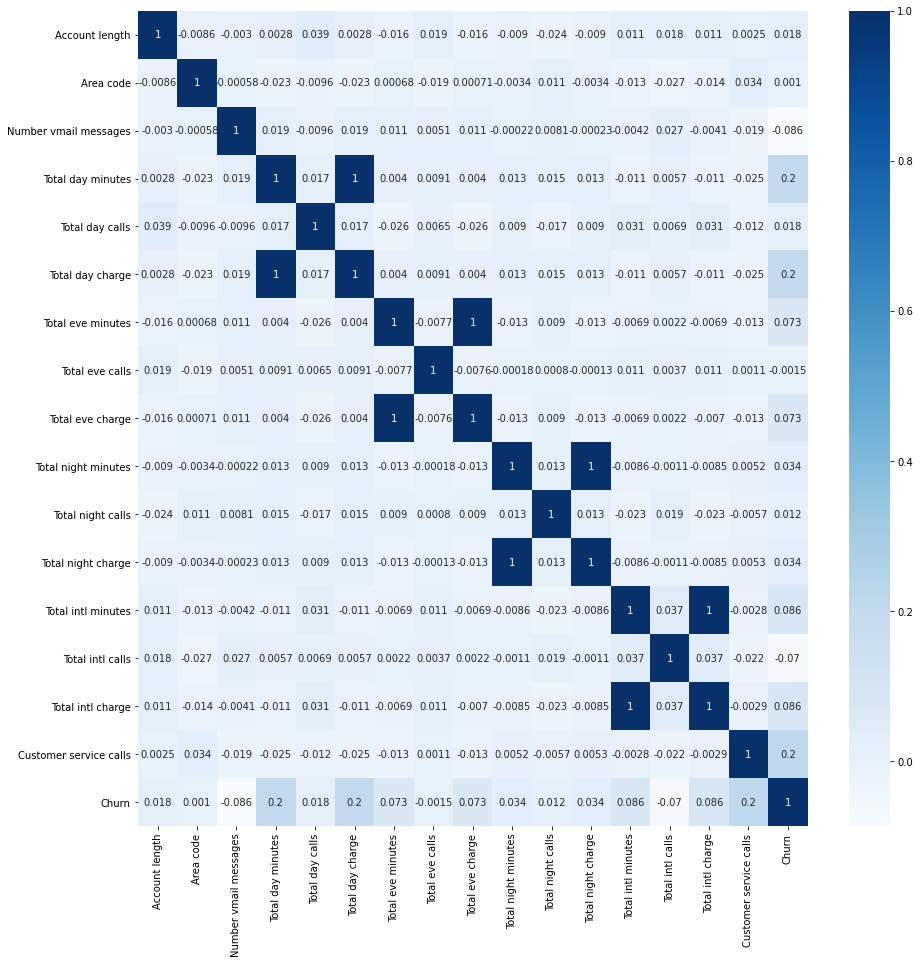

In [9]:
plt.figure(figsize=(15,15))
sns.heatmap(df.corr(),cmap='Blues',annot=True)

In [10]:
df.isna().sum()

State                     0
Account length            0
Area code                 0
International plan        0
Voice mail plan           0
Number vmail messages     0
Total day minutes         0
Total day calls           0
Total day charge          0
Total eve minutes         0
Total eve calls           0
Total eve charge          0
Total night minutes       0
Total night calls         0
Total night charge        0
Total intl minutes        0
Total intl calls          0
Total intl charge         0
Customer service calls    0
Churn                     0
dtype: int64

<AxesSubplot:xlabel='International plan'>

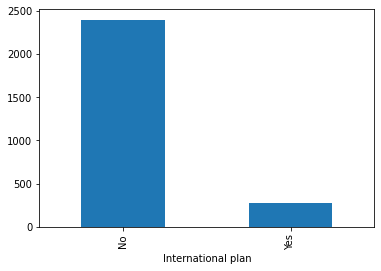

In [11]:
df.groupby('International plan')['International plan'].count().plot(kind='bar',)

<AxesSubplot:xlabel='International plan', ylabel='count'>

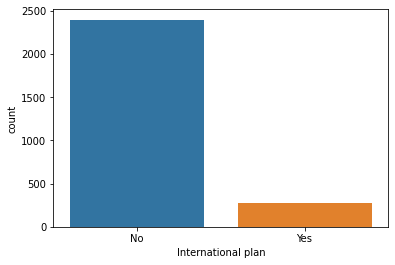

In [12]:
sns.countplot(df['International plan'])

<AxesSubplot:xlabel='Voice mail plan', ylabel='count'>

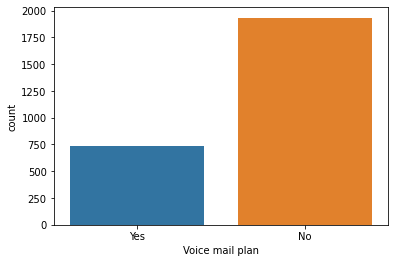

In [13]:
sns.countplot(df['Voice mail plan'])

<AxesSubplot:xlabel='Total day calls', ylabel='Count'>

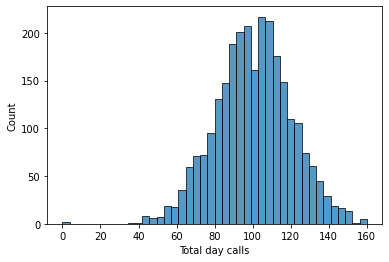

In [14]:
sns.histplot(df['Total day calls'])

<AxesSubplot:xlabel='Total day charge', ylabel='Count'>

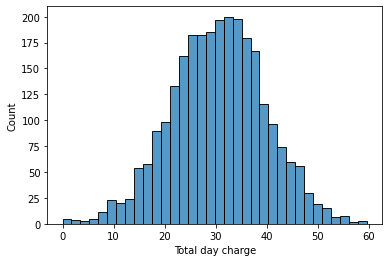

In [15]:
sns.histplot(df['Total day charge'])

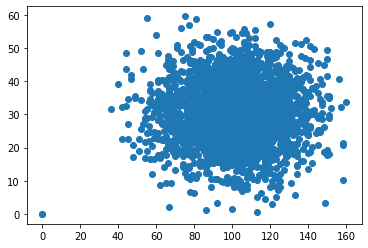

In [16]:
x=df['Total day calls']
y=df['Total day charge']
plt.scatter(x,y)

([<matplotlib.patches.Wedge at 0x2443aecbb88>,
 [Text(-0.987013487405142, 0.4855969271734941, 'False'),
  Text(0.9870135101375737, -0.4855968809680577, 'True')])

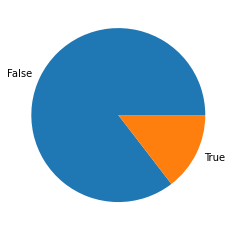

In [17]:
#Display pie chart for value count in Churn 
data=df['Churn'].value_counts()
label=df['Churn'].unique()

plt.pie(data,labels=label)

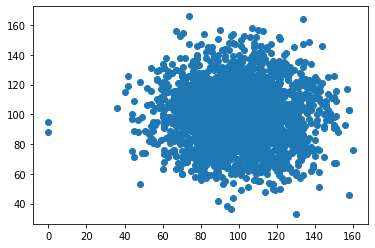

In [18]:
#Display a scatter plot between total day calls and total night calls
plt.scatter(df['Total day calls'],df['Total night calls'])

<AxesSubplot:xlabel='Churn', ylabel='Total day minutes'>

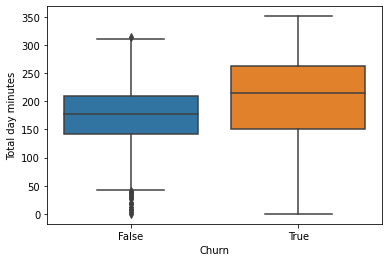

In [19]:
#Display a boxplot of Total day minutes with respect to Churn
sns.boxplot(x=df['Churn'],y=df['Total day minutes'])

<AxesSubplot:xlabel='Churn', ylabel='Total day charge'>

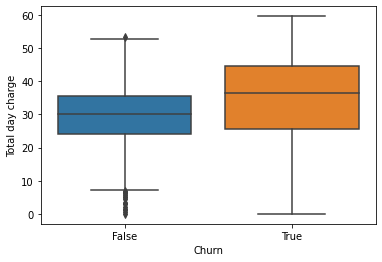

In [20]:
#Display a boxplot of Total day charge with respect to Churn
sns.boxplot(x=df['Churn'],y=df['Total day charge'])

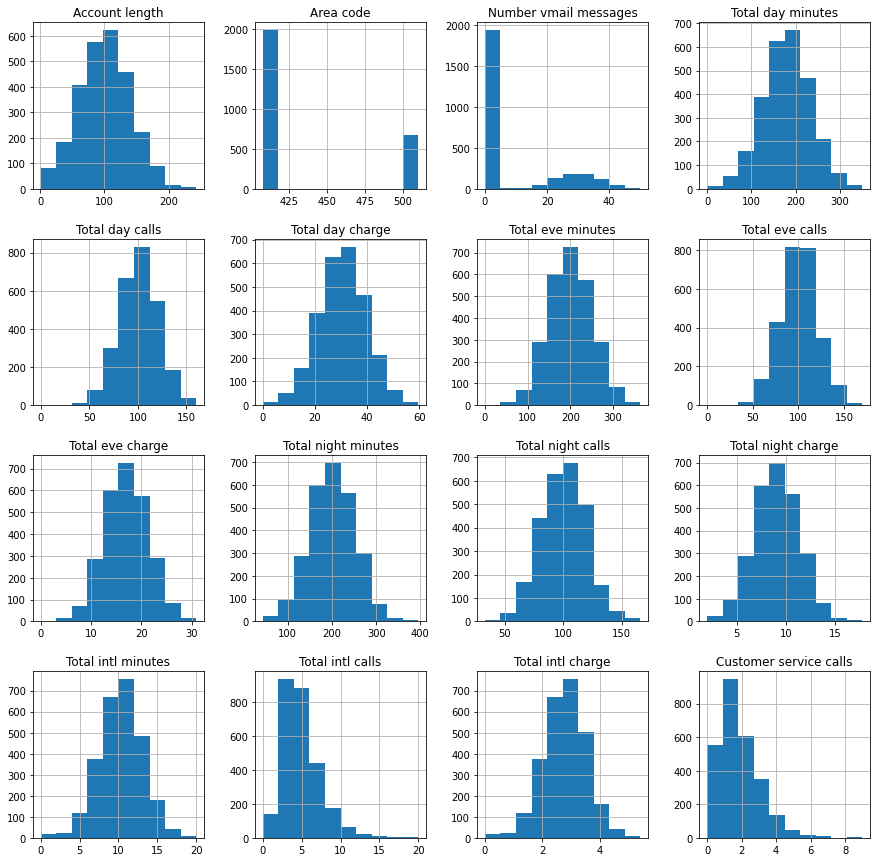

In [21]:
df.hist(figsize=(15,15))
plt.show()

In [22]:
df.columns

Index(['State', 'Account length', 'Area code', 'International plan',
       'Voice mail plan', 'Number vmail messages', 'Total day minutes',
       'Total day calls', 'Total day charge', 'Total eve minutes',
       'Total eve calls', 'Total eve charge', 'Total night minutes',
       'Total night calls', 'Total night charge', 'Total intl minutes',
       'Total intl calls', 'Total intl charge', 'Customer service calls',
       'Churn'],
      dtype='object')

In [30]:
l1=['Account length','Number vmail messages', 'Total day minutes',
       'Total day calls', 'Total day charge', 'Total eve minutes',
       'Total eve calls', 'Total eve charge', 'Total night minutes',
       'Total night calls', 'Total night charge', 'Total intl minutes',
       'Total intl calls', 'Total intl charge', 'Customer service calls']

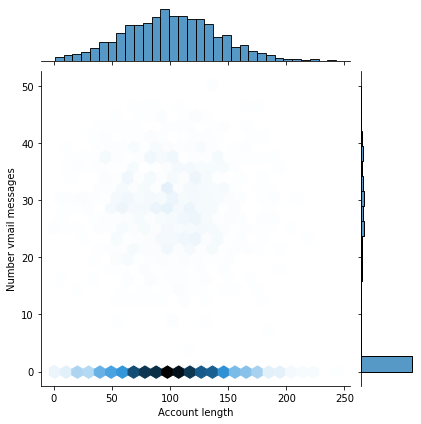

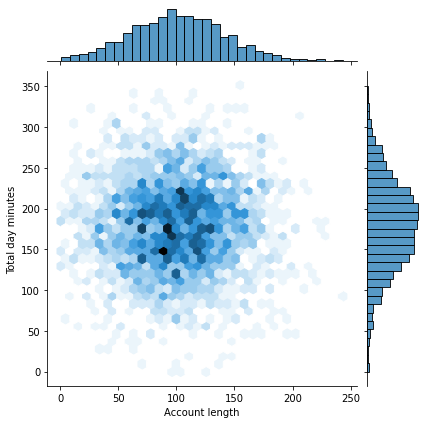

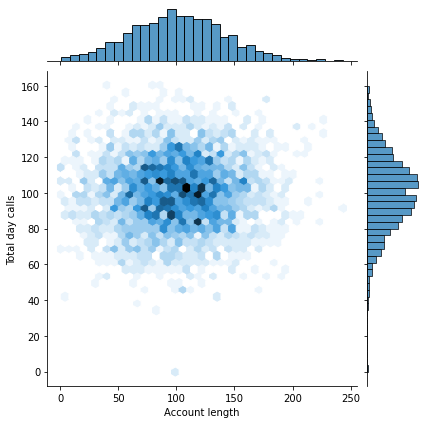

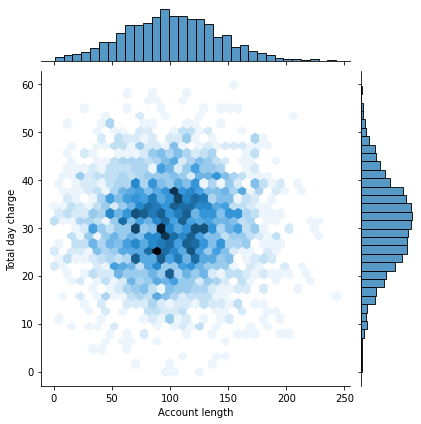

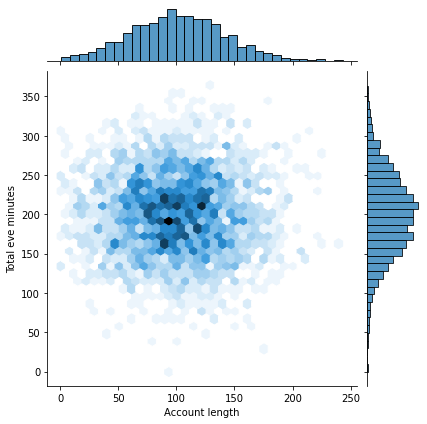

...

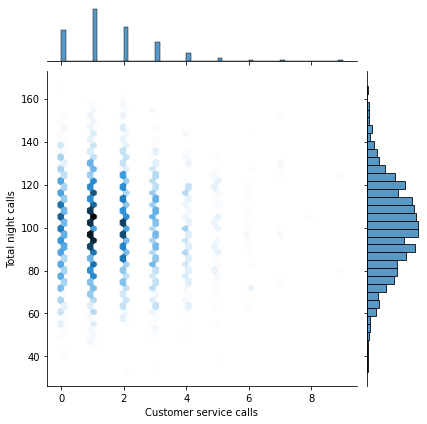

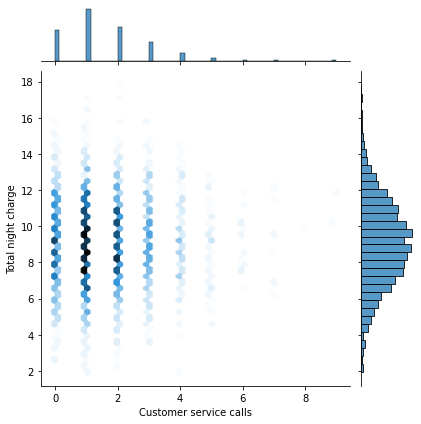

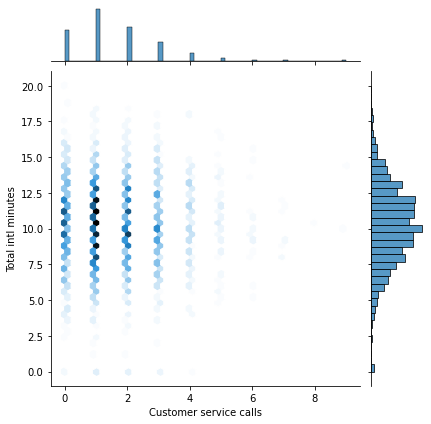

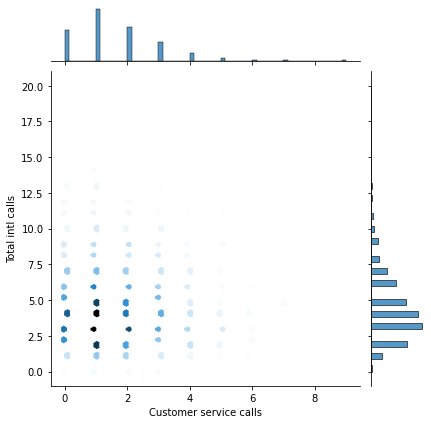

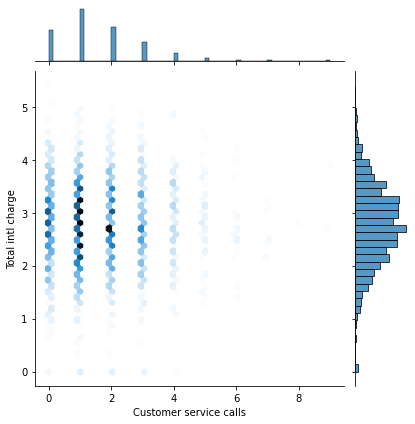

In [33]:
for i in l1:
    for j in l1:
        if i==j:
            continue
        sns.jointplot(x=df[i],y=df[j],kind='hex')
        plt.ylabel(j)
        plt.show()

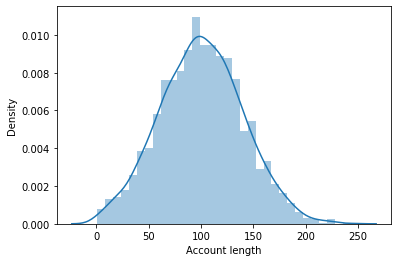

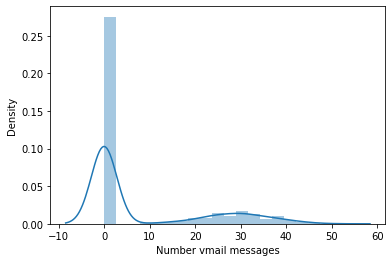

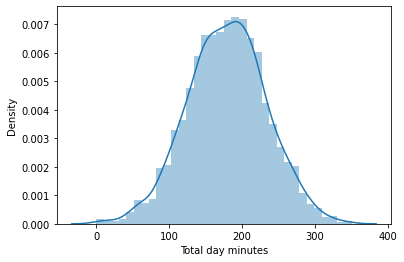

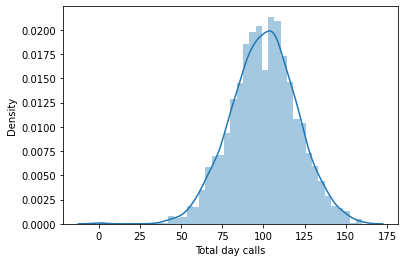

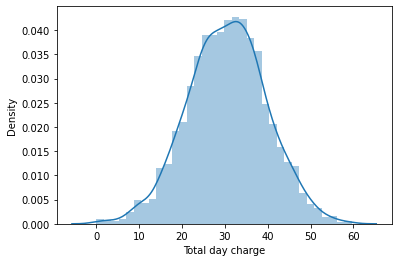

...

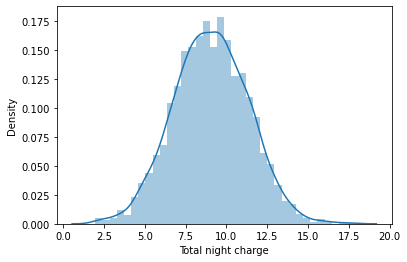

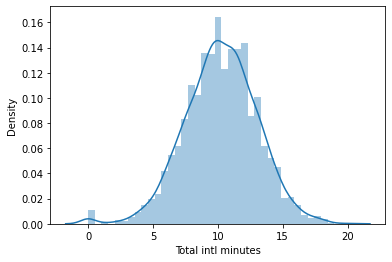

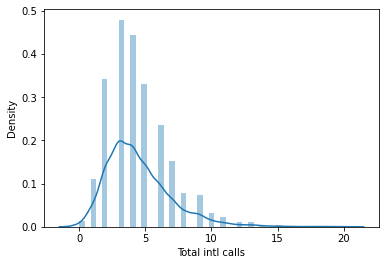

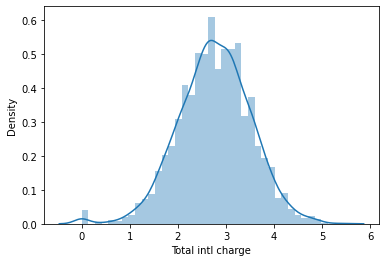

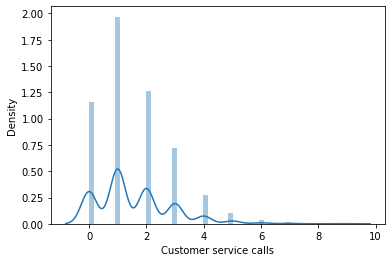

In [29]:

for i in l1:
    sns.distplot(df[i])
    plt.show()

#  Label encoding for churn columns

In [21]:
df['Churn']=df['Churn'].map({True:1,False:0})

In [22]:
df['International plan']=df['International plan'].map({'Yes':1,"No":0})

In [23]:
df['Voice mail plan']=df['Voice mail plan'].map({'Yes':1,"No":0})

In [24]:
df

,State,Account length,Area code,International plan,Voice mail plan,Number vmail messages,Total day minutes,Total day calls,Total day charge,Total eve minutes,Total eve calls,Total eve charge,Total night minutes,Total night calls,Total night charge,Total intl minutes,Total intl calls,Total intl charge,Customer service calls,Churn
0,KS,128,415,0,1,25,265.1,110,45.07,197.4,99,16.78,244.7,91,11.01,10.0,3,2.70,1,0
1,OH,107,415,0,1,26,161.6,123,27.47,195.5,103,16.62,254.4,103,11.45,13.7,3,3.70,1,0
2,NJ,137,415,0,0,0,243.4,114,41.38,121.2,110,10.30,162.6,104,7.32,12.2,5,3.29,0,0
3,OH,84,408,1,0,0,299.4,71,50.90,61.9,88,5.26,196.9,89,8.86,6.6,7,1.78,2,0
4,OK,75,415,1,0,0,166.7,113,28.34,148.3,122,12.61,186.9,121,8.41,10.1,3,2.73,3,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2661,SC,79,415,0,0,0,134.7,98,22.90,189.7,68,16.12,221.4,128,9.96,11.8,5,3.19,2,0
2662,AZ,192,415,0,1,36,156.2,77,26.55,215.5,126,18.32,279.1,83,12.56,9.9,6,2.67,2,0
2663,WV,68,415,0,0,0,231.1,57,39.29,153.4,55,13.04,191.3,123,8.61,9.6,4,2.59,3,0
2664,RI,28,510,0,0,0,180.8,109,30.74,288.8,58,24.55,191.9,91,8.64,14.1,6,3.81,2,0


In [25]:
df.drop('State',inplace=True,axis=1)

In [26]:
x=df.drop('Churn',axis=1)
y=df['Churn']

In [27]:
from sklearn.feature_selection import SelectKBest,chi2
best=SelectKBest(chi2,10) 
best.fit(x,y)

SelectKBest(score_func=<function chi2 at 0x000001E33E31AAF8>)

In [28]:
best.scores_

array([1.30296322e+01, 1.14346986e-02, 1.84492057e+02, 1.90567196e+01,
       4.60322168e+02, 1.67097410e+03, 3.55091746e+00, 2.84061945e+02,
       1.83515789e+02, 2.56571833e-02, 1.55929474e+01, 3.86558972e+01,
       1.50933395e+00, 1.73912482e+00, 1.50407762e+01, 1.75751169e+01,
       4.06099326e+00, 1.20347409e+02])

In [29]:
score=pd.DataFrame({'Score':best.scores_},index=x.columns)

In [30]:
score.sort_values(by='Score',inplace=True,ascending=False)

<AxesSubplot:>

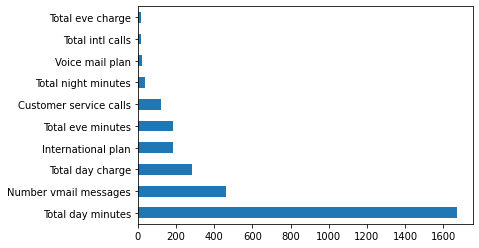

In [31]:
score['Score'].nlargest(10).plot(kind='barh')

In [32]:
selected_columns=score['Score'].nlargest(10).index

In [33]:
selected_columns

Index(['Total day minutes', 'Number vmail messages', 'Total day charge',
       'International plan', 'Total eve minutes', 'Customer service calls',
       'Total night minutes', 'Voice mail plan', 'Total intl calls',
       'Total eve charge'],
      dtype='object')

In [34]:
x=df[selected_columns]

In [35]:
from sklearn.model_selection import train_test_split
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.3,random_state=2)

In [36]:
x_train.shape,x_test.shape,y_train.shape,y_test.shape

((1866, 10), (800, 10), (1866,), (800,))

# Apply different algorithms

In [37]:
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC


In [38]:
models={
    'logisticsRegression':LogisticRegression(),
    'DecisionTree':DecisionTreeClassifier(),
    'naive_bsyes':GaussianNB(),
    'Random_forest_classifier':RandomForestClassifier(),
    'KNN':KNeighborsClassifier(),
    'SVM':SVC()
}

In [39]:
score=[]
for name,model in models.items():
    cls=model.fit(x_train,y_train)
    score.append(cls.score(x_test,y_test))
    print(f"{name} accuracy_score: {cls.score(x_test,y_test)}")
    

logisticsRegression accuracy_score: 0.8725
DecisionTree accuracy_score: 0.89625
naive_bsyes accuracy_score: 0.86625
Random_forest_classifier accuracy_score: 0.94
KNN accuracy_score: 0.8875
SVM accuracy_score: 0.8675


# LogisticRegression

In [40]:
model=LogisticRegression().fit(x_train,y_train)
model.score(x_test,y_test)

0.8725

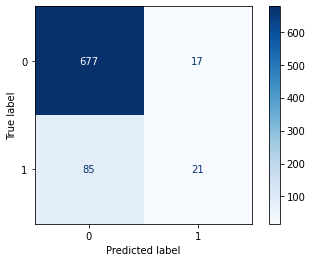

In [41]:
from sklearn.metrics import plot_confusion_matrix,confusion_matrix
plot_confusion_matrix(model,x_test,y_test,cmap='Blues')

In [42]:
y_pred=model.predict(x_test)

In [43]:
from sklearn.metrics import classification_report
print(classification_report(y_test,y_pred,digits=5))

              precision    recall  f1-score   support

           0    0.88845   0.97550   0.92995       694
           1    0.55263   0.19811   0.29167       106

    accuracy                        0.87250       800
   macro avg    0.72054   0.58681   0.61081       800
weighted avg    0.84396   0.87250   0.84537       800



# Hyper parameter tuning of logisticRegression

In [44]:
model = LogisticRegression()
solvers = ['newton-cg', 'lbfgs', 'liblinear']
penalty = ['l2',"l1"]
c_values = [100, 10, 1.0, 0.1, 0.01]

In [45]:
random_grid = {'n_estimators': model,
               'solvers':solvers,
               "penalty":penalty,
               'c_values':c_values}

In [46]:
from sklearn.model_selection import RepeatedStratifiedKFold
from sklearn.model_selection import GridSearchCV
grid = dict(solver=solvers,penalty=penalty,C=c_values)
cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)
grid_search = GridSearchCV(estimator=model, param_grid=grid, n_jobs=-1, cv=cv, scoring='accuracy',error_score=0)
grid_result = grid_search.fit(x_train,y_train)

In [47]:
grid_result.best_score_

0.8585187740785464

In [48]:
grid_result.best_params_

{'C': 0.1, 'penalty': 'l2', 'solver': 'liblinear'}

In [49]:
model=LogisticRegression(C=0.1,penalty='l2',solver='liblinear').fit(x_train,y_train)

In [50]:
y_pred=model.predict(x_test)

In [51]:
from sklearn.metrics import classification_report
print(classification_report(y_test,y_pred,digits=5))

              precision    recall  f1-score   support

           0    0.87659   0.99280   0.93108       694
           1    0.64286   0.08491   0.15000       106

    accuracy                        0.87250       800
   macro avg    0.75972   0.53885   0.54054       800
weighted avg    0.84562   0.87250   0.82759       800



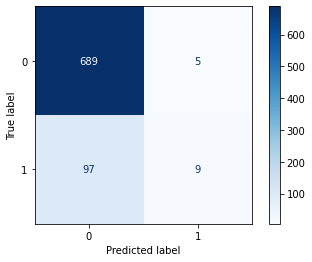

In [52]:
from sklearn.metrics import plot_confusion_matrix
plot_confusion_matrix(model,x_test,y_test,cmap='Blues')

# kfold and cross val score of support vector classifier

In [53]:
from sklearn.svm import SVC
model=SVC()

In [54]:
from sklearn.model_selection import KFold,cross_val_score
kfold = KFold(n_splits=10)
cv_result =cross_val_score(model,x_train,y_train,cv=kfold)

In [55]:
cv_result

array([0.89304813, 0.87165775, 0.85561497, 0.86631016, 0.81283422,
       0.84491979, 0.80107527, 0.83870968, 0.82258065, 0.88709677])

# Hyperparameter tuning of svm

In [56]:
model = SVC()
kernel = ['poly', 'rbf', 'sigmoid']
C = [50, 10, 1.0, 0.1, 0.01]
gamma = ['scale']
# define grid search
grid = dict(kernel=kernel,C=C,gamma=gamma)
cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)
grid_search = GridSearchCV(estimator=model, param_grid=grid, n_jobs=-1, cv=cv, scoring='accuracy',error_score=0)
grid_result = grid_search.fit(x_train,y_train)

In [57]:
grid_result.best_params_

{'C': 50, 'gamma': 'scale', 'kernel': 'rbf'}

In [58]:
model=SVC(C=50,gamma='scale',kernel='rbf').fit(x_train,y_train)
model.score(x_test,y_test)
y_pred=model.predict(x_test)

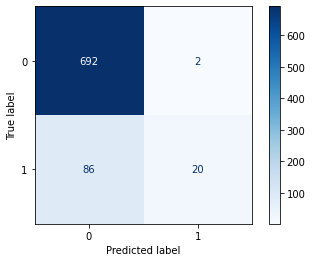

In [59]:
plot_confusion_matrix(model,x_test,y_test,cmap='Blues')

In [60]:
print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

           0       0.89      1.00      0.94       694
           1       0.91      0.19      0.31       106

    accuracy                           0.89       800
   macro avg       0.90      0.59      0.63       800
weighted avg       0.89      0.89      0.86       800



# hyper parameter tuning KNN

In [61]:
model = KNeighborsClassifier()
n_neighbors = range(1, 100, 3)
weights = ['uniform', 'distance']
metric = ['euclidean', 'manhattan', 'minkowski']
# define grid search
grid = dict(n_neighbors=n_neighbors,weights=weights,metric=metric)
cv = RepeatedStratifiedKFold(n_splits=10,n_repeats=3,random_state=1)
grid_search = GridSearchCV(estimator=model, param_grid=grid, n_jobs=-1, cv=cv, scoring='accuracy')
grid_result = grid_search.fit(x_train,y_train)

In [62]:
grid_result.best_params_

{'metric': 'manhattan', 'n_neighbors': 13, 'weights': 'distance'}

In [63]:
model = KNeighborsClassifier(metric= 'manhattan', n_neighbors= 13, weights='distance').fit(x_train,y_train)

In [64]:
model.score(x_test,y_test)

0.89875

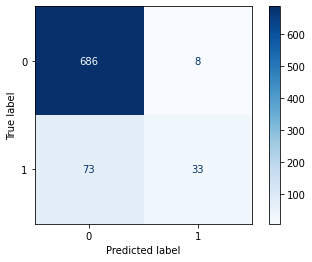

In [65]:
plot_confusion_matrix(model,x_test,y_test,cmap='Blues')

In [66]:
y_pred=model.predict(x_test)

In [67]:
print(classification_report(y_test,y_pred,digits=5))

              precision    recall  f1-score   support

           0    0.90382   0.98847   0.94425       694
           1    0.80488   0.31132   0.44898       106

    accuracy                        0.89875       800
   macro avg    0.85435   0.64990   0.69662       800
weighted avg    0.89071   0.89875   0.87863       800



# Hyper parameter tuning for DecisionTreeClassifier

In [68]:
model=DecisionTreeClassifier()

In [69]:
criterion=['gini','entropy']
splitter=['best','random']
max_depth=[2,4,5,10,15,20,25,30]


   

In [70]:
grid = dict(criterion=criterion, splitter=splitter, max_depth=max_depth)
cv = RepeatedStratifiedKFold(n_splits=10,n_repeats=3,random_state=1)
grid_search = GridSearchCV(estimator=model, param_grid=grid, n_jobs=-1, cv=cv, scoring='accuracy')
grid_result = grid_search.fit(x_train,y_train)

In [71]:
grid_result.best_params_

{'criterion': 'entropy', 'max_depth': 10, 'splitter': 'best'}

In [72]:
model=DecisionTreeClassifier(criterion='entropy',max_depth=10,splitter='best').fit(x_train,y_train)

In [73]:
model.score(x_test,y_test)

0.92125

In [74]:
y_pred=model.predict(x_test)

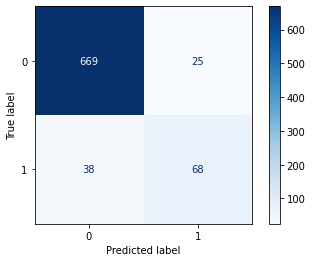

In [75]:
plot_confusion_matrix(model,x_test,y_test,cmap='Blues')

In [76]:
print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

           0       0.95      0.96      0.96       694
           1       0.73      0.64      0.68       106

    accuracy                           0.92       800
   macro avg       0.84      0.80      0.82       800
weighted avg       0.92      0.92      0.92       800



# Hyper parameter tuning for random forest

In [77]:
model = RandomForestClassifier()
n_estimators = [10,50,75,100]
max_features = ['sqrt','log2']
# define grid search
grid = dict(n_estimators=n_estimators,max_features=max_features )
cv = RepeatedStratifiedKFold(n_splits=10,n_repeats=3,random_state=1)
grid_search = GridSearchCV(estimator=model, param_grid=grid, n_jobs=-1, cv=cv, scoring='accuracy')
grid_result = grid_search.fit(x_train,y_train)

In [78]:
grid_result.best_params_

{'max_features': 'log2', 'n_estimators': 75}

In [79]:
model = RandomForestClassifier(n_estimators=100,max_features='sqrt').fit(x_train,y_train)

In [80]:
model.score(x_test,y_test)

0.94

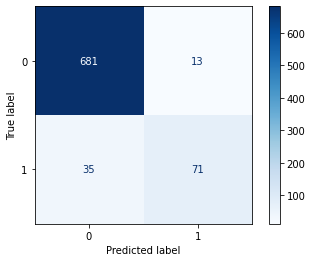

In [81]:
plot_confusion_matrix(model,x_test,y_test,cmap='Blues')

In [82]:
y_pred=model.predict(x_test)

In [83]:
print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

           0       0.95      0.98      0.97       694
           1       0.85      0.67      0.75       106

    accuracy                           0.94       800
   macro avg       0.90      0.83      0.86       800
weighted avg       0.94      0.94      0.94       800



# Kmeans clustering

In [84]:
from sklearn.cluster import KMeans

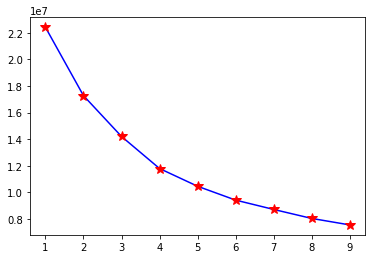

In [85]:
points=[]
n_clusters=range(1,10)
for i in n_clusters:
    kmean=KMeans(n_clusters=i).fit(x)
    points.append(kmean.inertia_)
    
plt.plot(n_clusters,points,'b*-', markersize=10,mec='r',mfc='r')

In [86]:
kmeans=KMeans(n_clusters=4)
label=kmeans.fit_predict(x)

In [87]:
x['label']=label

In [88]:
from sklearn.metrics import silhouette_score
silhouette_score(x,label)

0.22009345783232057

# Apply PCA

In [92]:
from sklearn.decomposition import PCA
pca=PCA(3)

In [93]:
pc1=pca.fit_transform(x)

In [94]:
principal_component = pd.DataFrame(data = pc1, columns = ["PCA1","PCA2","PCA3"])

In [95]:
principal_component

,PCA1,PCA2,PCA3
0,-90.132156,22.479506,28.832781
1,13.708421,31.645011,44.642152
2,-59.847607,47.284583,-78.680069
3,-118.082468,114.541504,-84.062486
4,15.165983,38.115700,-37.746011
...,...,...,...
2661,43.857975,20.653325,15.557793
2662,16.694616,27.004628,76.472377
2663,-50.405212,34.334718,-36.648839
2664,-2.264801,-81.138532,37.005995
